In [19]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go
from scipy.ndimage import zoom
from skimage import measure

In [11]:
file_path = "../../volumes/scan_003.raw"
raw_img_1d = np.fromfile(file_path, dtype=np.dtype('<u2'))
raw_img = np.reshape(np.array(raw_img_1d), (1280, 768, 768)).astype(np.float32)



In [14]:
def downsample_data(data, factor=4):
    
    factor = ((1280/factor)/1280, (768/factor)/768, (768/factor)/768)
    downsampled_data = zoom(data, factor, order=1)/65535
    downsampled_data = downsampled_data.transpose(2, 1, 0)
    return downsampled_data
downsampled_data = downsample_data(raw_img, 4)
downsampled_data.flatten().shape

(11796480,)

In [15]:
def plot_raw_downsampled_data(downsampled_data, subsample=1, point_size=1, threshold = 0.05):
    #downsampled_data is a 3d array from the raw file that is downsized
    #subsample adjusts the density of points
    #point_size adjusts the size of the points
    #threshold adjusts minimum value to show up on the graph
    
    x, y, z = np.indices(downsampled_data.shape)
    nonzero_mask = downsampled_data > threshold
    x, y, z = x[nonzero_mask], y[nonzero_mask], z[nonzero_mask]
    intensity = downsampled_data[nonzero_mask]  
    
    subsample = subsample  # Adjust to control density
    x, y, z, intensity = x[::subsample], y[::subsample], z[::subsample], intensity[::subsample]
    
    colors = (intensity - intensity.min()) / (intensity.max() - intensity.min())
    
    fig = go.Figure(data=[go.Scatter3d(
        x=x, 
        y=y, 
        z=z,
        mode='markers',
        marker=dict(
            size=point_size,             # Point size
            color=colors,       # Color based on normalized intensity
            colorscale='Viridis',
            opacity=0.8         # Transparency
        )
    )])
    
    fig.update_layout(
        scene=dict(
            xaxis_title="X",
            yaxis_title="Y",
            zaxis_title="Z",
            aspectmode='cube'
        ),
        width=800,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        pad=4
    )
    )
    
    fig.show()

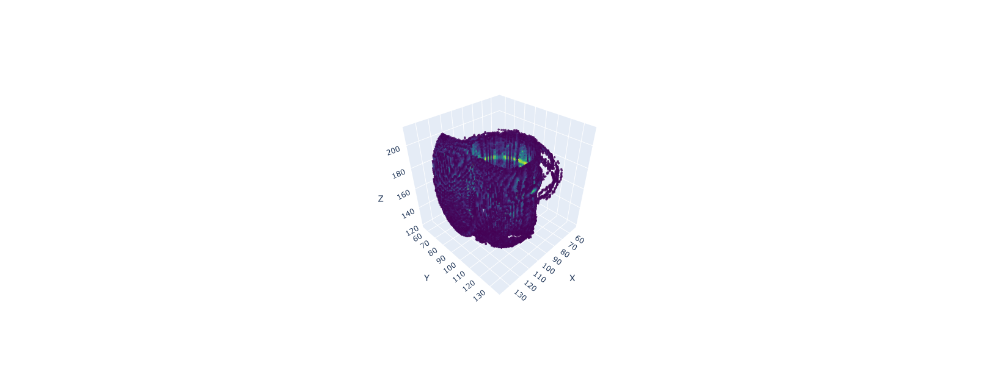

In [20]:
plot_raw_downsampled_data(downsampled_data, subsample=1, point_size=2, threshold = 0.01)

In [21]:
# Assuming `downsampled_data` is your 3D data array
def plot_mesh_from_data(downsampled_data, threshold=0.05):
    verts, faces, _, _ = measure.marching_cubes(downsampled_data, level=threshold)
    
    x, y, z = verts[:, 0], verts[:, 1], verts[:, 2]
    
    fig = go.Figure(data=[go.Mesh3d(
        x=x,
        y=y,
        z=z,
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        color='lightblue',
        opacity=0.5
    )])
    
    fig.update_layout(
        scene=dict(
            xaxis_title="X",
            yaxis_title="Y",
            zaxis_title="Z",
            aspectmode='cube'
        ),
        width=800,
        height=600,
        margin=dict(l=50, r=50, b=100, pad=4)
    )
    
    fig.show()

# Usage: Call the function with your downsampled 3D data
plot_mesh_from_data(downsampled_data, threshold=0.03)